In [10]:
import pickle

dts_p = "/home/lq53/mir_repos/dappy_24_nov/byws_version/try_results/try/datastruct.p"
# Load the data structure
with open(dts_p, "rb") as f:
    loaded_data_obj = pickle.load(f)

# Access the attributes of the reloaded object
# print(loaded_data_obj.data.head(10))  # Inspect the data DataFrame
# print(loaded_data_obj.embed_vals)  # Check embeddings
# print(loaded_data_obj.ws)  # Look at Watershed object

print(dir(loaded_data_obj))  # Lists all attributes of the object

# print(loaded_data_obj.data) 


    id  frame      AnimalID   Sex Condition        date   time  \
0  0.0      0  1686940_left  male  baseline  2024_06_26  15:02   
1  0.0     10  1686940_left  male  baseline  2024_06_26  15:02   
2  0.0     20  1686940_left  male  baseline  2024_06_26  15:02   
3  0.0     30  1686940_left  male  baseline  2024_06_26  15:02   
4  0.0     40  1686940_left  male  baseline  2024_06_26  15:02   
5  0.0     50  1686940_left  male  baseline  2024_06_26  15:02   
6  0.0     60  1686940_left  male  baseline  2024_06_26  15:02   
7  0.0     70  1686940_left  male  baseline  2024_06_26  15:02   
8  0.0     80  1686940_left  male  baseline  2024_06_26  15:02   
9  0.0     90  1686940_left  male  baseline  2024_06_26  15:02   

                                     Prediction_path  miniscope  \
0  /data/big_rim/rsync_dcc_sum/24summ/2024_06_26/...          0   
1  /data/big_rim/rsync_dcc_sum/24summ/2024_06_26/...          0   
2  /data/big_rim/rsync_dcc_sum/24summ/2024_06_26/...          0   
3  /d

In [38]:
print(dir(loaded_data_obj))  # Lists all attributes of the object


['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_props', 'check_reset_data', 'connectivity', 'data', 'downsample', 'embed_vals', 'feat_shape', 'feature_labels', 'features', 'frame', 'get_frequencies', 'id', 'meta', 'meta_by_frame', 'meta_unique', 'n_frames', 'pose', 'write_pickle', 'ws']


In [40]:
# Inspect the unique Prediction_path entries
unique_paths = loaded_data_obj.data['Prediction_path'].unique()
print(f"Unique Prediction Paths ({len(unique_paths)}):")
for path in unique_paths:
    print(path)


Unique Prediction Paths (353900):
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
1360
1370
1380
1390
1400
1410
1420
1430
1440
1450
1460
1470
1480
1490
1500
1510
1520
1530
1540
1550
1560
1570
1580
1590
1600
1610
1620
1630
1640
1650
1660
1670
1680
1690
1700
1710
1720
1730
1740
1750
1760
1770
1780
1790
1800
1810
1820
1830
1840
1850
1860
1870
1880
1890
1900
1910
1920
1930
1940
1950
1960
1970
1980
1990
2000
2010
2020
2030
2040
2050
2060
2070
2080
2090
2100
2110
2120
2130
2140
21

In [31]:
# Define the path you want to check
path_to_check = "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_17_05"

# Check if the path exists in the unique paths
exists = path_to_check in unique_paths

print(f"Does the path exist? {exists}")


Does the path exist? False


In [94]:
import json
import h5py
import numpy as np
import os

def export_aligned_data_to_h5(
    data_obj, 
    rec_path, 
    frame_mapping_file, 
    out_file
):
    """
    Filters data_obj to a specific rec_path and frames from frame_mapping_file,
    then saves minimal data to an HDF5 file (with string columns stored
    as variable-length UTF-8 strings).
    """
    
    # 1. Filter by Prediction_path
    rec_mat_path = os.path.join(rec_path, "DANNCE/predict00/save_data_AVG.mat")
    path_data = data_obj.data[data_obj.data["Prediction_path"] == rec_mat_path].copy()
    if path_data.empty:
        print(f"No data found for rec_path: {rec_mat_path}")
        return
    
    # 2. Read the frame mapping JSON
    with open(frame_mapping_file, "r") as f:
        map_data = json.load(f)
    mapped_frames = set(map_data["mapped_sixcam_frame_indices"])
    time_offset = map_data["time_offset"]
    
    # 3. Filter rows by mapped frame indices (assuming your DataFrame has 'frame' column)
    if "frame" not in path_data.columns:
        raise ValueError("DataFrame does not have 'frame' column to filter by.")
    
    # Adjust frames so that they start at 0
    min_frame = path_data["frame"].min()
    path_data["frame"] = path_data["frame"] - min_frame

    # 1. Create helper offsets DataFrame
    offsets = pd.DataFrame({'offset': range(10)})

    # 2. Cross-merge (pandas 1.2+ supports `how="cross"`)
    expanded = path_data.merge(offsets, how='cross')

    # 3. Update the frame by adding the offset
    expanded['frame'] = expanded['frame'] + expanded['offset']
    expanded.drop(columns='offset', inplace=True)
    
    filtered_data = expanded[expanded["frame"].isin(mapped_frames)]
    
    if filtered_data.empty:
        print("No overlapping frames found between path_data and mapped_sixcam_frame_indices.")
    
    # 4. Save to HDF5
    os.makedirs(os.path.dirname(out_file), exist_ok=True)
    # Use variable-length string dtype for columns that are (or become) text
    variable_length_string_dt = h5py.special_dtype(vlen=str)
    
    with h5py.File(out_file, "w") as hf:
        
        #
        # (A) Save filtered DataFrame columns
        #
        grp = hf.create_group("filtered_data")
        
        for col in filtered_data.columns:
            col_data = filtered_data[col].to_numpy()  # get as NumPy array
            
            # Check if it's string-like (object, unicode, or bytes)
            if col_data.dtype.kind in ["O", "U", "S"]:
                # Convert each element to a Python string, store as variable-length UTF-8
                # Flatten, map to str, then reshape to original shape if multi-dimensional
                original_shape = col_data.shape
                col_data = col_data.reshape(-1)  # flatten
                col_data = np.array([str(item) for item in col_data], dtype=object)
                col_data = col_data.reshape(original_shape)
                
                grp.create_dataset(
                    col, 
                    data=col_data, 
                    dtype=variable_length_string_dt, 
                    compression="gzip"
                )
            else:
                # Numeric or other supported dtype can be written directly
                grp.create_dataset(col, data=col_data, compression="gzip")
        
        #
        # (B) Save relevant data_obj attributes
        #
        if hasattr(data_obj, "embed_vals") and data_obj.embed_vals is not None:
            hf.create_dataset("embed_vals", data=data_obj.embed_vals, compression="gzip")
        
        # Example: saving meta info
        if hasattr(data_obj, "meta") and data_obj.meta is not None:
            meta_grp = hf.create_group("meta")
            if isinstance(data_obj.meta, dict):
                for key, val in data_obj.meta.items():
                    # Convert to array for consistency
                    val_array = np.array(val, dtype=object)  # object to handle strings
                    # If it has any string/unicode, cast them properly
                    if val_array.dtype.kind in ["O", "U", "S"]:
                        val_array = val_array.reshape(-1)
                        val_array = np.array([str(item) for item in val_array], dtype=object)
                        # Reshape back if needed (only if it's consistent)
                        # But typically meta might be a 1D list, so might not need reshape
                        
                        meta_grp.create_dataset(
                            key,
                            data=val_array,
                            dtype=variable_length_string_dt,
                            compression="gzip"
                        )
                    else:
                        meta_grp.create_dataset(key, data=val_array, compression="gzip")
            else:
                # Non-dict meta structure
                meta_vals = np.array(data_obj.meta, dtype=object)
                if meta_vals.dtype.kind in ["O", "U", "S"]:
                    meta_vals = [str(item) for item in meta_vals.flatten()]
                    meta_vals = np.array(meta_vals, dtype=object)
                    meta_grp.create_dataset(
                        "meta_data",
                        data=meta_vals,
                        dtype=variable_length_string_dt,
                        compression="gzip"
                    )
                else:
                    meta_grp.create_dataset("meta_data", data=meta_vals, compression="gzip")
        
        #
        # (C) Save frame mapping info
        #
        map_grp = hf.create_group("frame_mapping")
        map_grp.create_dataset(
            "mapped_sixcam_frame_indices",
            data=np.array(map_data["mapped_sixcam_frame_indices"]),
            compression="gzip"
        )
        map_grp.attrs["time_offset"] = time_offset

    print(f"Filtered data for '{rec_path}' saved to '{out_file}'")


In [ ]:
# import json
# import h5py
# import numpy as np
# import os

# def export_aligned_data_to_h5(
#     data_obj, 
#     rec_path, 
#     frame_mapping_file, 
#     out_file
# ):
#     """
#     Filters data_obj to a specific rec_path and frames from frame_mapping_file,
#     then saves minimal data to an HDF5 file (with string columns stored
#     as variable-length UTF-8 strings).
#     """
    
#     # 1. Filter by Prediction_path
#     rec_mat_path = os.path.join(rec_path, "DANNCE/predict00/save_data_AVG.mat")
#     path_data = data_obj.data[data_obj.data["Prediction_path"] == rec_mat_path].copy()
#     if path_data.empty:
#         print(f"No data found for rec_path: {rec_mat_path}")
#         return
    
#     # 2. Read the frame mapping JSON
#     with open(frame_mapping_file, "r") as f:
#         map_data = json.load(f)
#     mapped_frames = set(map_data["mapped_sixcam_frame_indices"])
#     time_offset = map_data["time_offset"]
    
#     # 3. Filter rows by mapped frame indices (assuming your DataFrame has 'frame' column)
#     if "frame" not in path_data.columns:
#         raise ValueError("DataFrame does not have 'frame' column to filter by.")
    
#     # Adjust frames so that they start at 0
#     min_frame = path_data["frame"].min()
#     path_data["frame"] = path_data["frame"] - min_frame

    

In [102]:
import os
import h5py
import numpy as np
import pandas as pd

def export_aligned_data_to_h5_using_hdf5(
    data_obj, 
    rec_path, 
    aligned_h5_file,  # path to the 'aligned_predictions.h5' with 'camera_frame_sixcam'
    out_file
):
    """
    Filters data_obj to a specific rec_path and frames found in the 'camera_frame_sixcam'
    column of the aligned HDF5 file, then saves minimal data to an HDF5 file.
    """
    
    # 1. Filter by Prediction_path
    rec_mat_path = os.path.join(rec_path, "DANNCE/predict00/save_data_AVG.mat")
    path_data = data_obj.data[data_obj.data["Prediction_path"] == rec_mat_path].copy()
    if path_data.empty:
        print(f"No data found for rec_path: {rec_mat_path}")
        return
    
    # 2. Load the aligned DataFrame that includes the 'camera_frame_sixcam' column
    if not os.path.exists(aligned_h5_file):
        raise FileNotFoundError(f"Aligned HDF5 file not found: {aligned_h5_file}")
    
    df_aligned = pd.read_hdf(aligned_h5_file, key='df')
    if 'camera_frame_sixcam' not in df_aligned.columns:
        raise ValueError(f"'camera_frame_sixcam' column not found in {aligned_h5_file}.")
    
    # 3. Extract the set of mapped frames from the aligned DataFrame
    mapped_frames = set(df_aligned['camera_frame_sixcam'].values)
    print(f"Number of mapped frames found in {aligned_h5_file}: {len(mapped_frames)}")

    # (Optional) If you also stored a time offset in the HDF5, you could read it here.
    # For example, if you stored it as an attribute:
    """
    with h5py.File(aligned_h5_file, 'r') as hf:
        time_offset = hf.attrs.get('time_offset', None)
    """
    # But often you'd just rely on the DataFrame itself, or store it as a separate JSON.
    # We'll skip that here unless you need it specifically.
    time_offset = None

    # 4. Filter rows by mapped frame indices
    #    We assume your `path_data` DataFrame has a 'frame' column that corresponds
    #    to the six-cam frames. If it doesn't match exactly, you may need to adjust 
    #    or rename columns accordingly.
    if "frame" not in path_data.columns:
        raise ValueError("DataFrame does not have a 'frame' column to filter by.")
    
    # Keep only rows that have frames in mapped_frames
    path_data = path_data[path_data["frame"].isin(mapped_frames)]
    if path_data.empty:
        print(f"No matching frames found in path_data after filtering by mapped_frames.")
        return
    
    # 5. Optionally adjust frames so they start at 0 (if that’s needed for your downstream processing)
    min_frame = path_data["frame"].min()
    path_data["frame"] = path_data["frame"] - min_frame
    
    # 6. Write the filtered data to an HDF5 file (or do your minimal version)
    #    Here’s an example that saves as a standard pandas HDF5.
    path_data.to_hdf(out_file, key='df', mode='w')
    print(f"Filtered data has been saved to {out_file}.")
    
    # If you need to store string columns as variable-length UTF-8,
    # you might do that with `h5py` directly, or by using a suitable
    # `table` format in `pandas.to_hdf()`.
    # But the above is the simplest approach.
    
    return path_data


In [93]:
# import pandas as pd

# # Sample input (only frames 0, 10, 20 here for demo)
# path_data = pd.DataFrame({
#     'frame': [0, 10, 20],
#     'some_value': ['A', 'B', 'C']
# })

# # 1. Create helper offsets DataFrame
# offsets = pd.DataFrame({'offset': range(10)})

# # 2. Cross-merge (pandas 1.2+ supports `how="cross"`)
# expanded = path_data.merge(offsets, how='cross')

# # 3. Update the frame by adding the offset
# expanded['frame'] = expanded['frame'] + expanded['offset']
# expanded.drop(columns='offset', inplace=True)

# print(expanded)


    frame some_value
0       0          A
1       1          A
2       2          A
3       3          A
4       4          A
5       5          A
6       6          A
7       7          A
8       8          A
9       9          A
10     10          B
11     11          B
12     12          B
13     13          B
14     14          B
15     15          B
16     16          B
17     17          B
18     18          B
19     19          B
20     20          C
21     21          C
22     22          C
23     23          C
24     24          C
25     25          C
26     26          C
27     27          C
28     28          C
29     29          C


In [104]:
rec_path = "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_17_05"
frame_mapping_file = "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_17_05/MIR_Aligned/frame_mapping.json"
out_file = "/home/lq53/mir_repos/dappy_24_nov/byws_version/try_results/try/aligned_mir_walalala_filtered_data.h5"

export_aligned_data_to_h5(
    data_obj=loaded_data_obj, 
    rec_path=rec_path, 
    frame_mapping_file=frame_mapping_file, 
    out_file=out_file
)


Filtered data for '/data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/20241002PMCr2_17_05' saved to '/home/lq53/mir_repos/dappy_24_nov/byws_version/try_results/try/aligned_mir_walalala_filtered_data.h5'


In [100]:

import h5py
import numpy as np
import pandas as pd

def load_filtered_data_from_h5(h5_file_path):
    """
    Loads the 'filtered_data' group from an HDF5 file into a Pandas DataFrame.
    """
    with h5py.File(h5_file_path, "r") as hf:
        # Access the group where the DataFrame columns were saved
        grp = hf["filtered_data"]
        
        # Each dataset in 'grp' is a column; read them into a dict of numpy arrays
        data_dict = {}
        for col_name in grp.keys():
            # Read dataset
            col_data = grp[col_name][:]
            
            # If it's a string dataset, h5py might already give you Python strings,
            # but just to be safe, handle bytes if encountered
            if col_data.dtype.kind in ["S", "O"] or isinstance(col_data.flatten()[0], bytes):
                col_data = [elem.decode("utf-8") if isinstance(elem, bytes) else elem 
                            for elem in col_data]
            
            data_dict[col_name] = col_data
        
    # Create a DataFrame from the data dictionary
    df = pd.DataFrame(data_dict)
    return df


aligned_dappy_path = "/home/lq53/mir_repos/dappy_24_nov/byws_version/try_results/try/aligned_mir_walalala_filtered_data.h5"
# Load it into a DataFrame
filtered_df = load_filtered_data_from_h5(aligned_dappy_path)
print(filtered_df.head())

        AnimalID  Cluster  Condition  \
0  20241002PMCr2       73  miniscope   
1  20241002PMCr2       73  miniscope   
2  20241002PMCr2       73  miniscope   
3  20241002PMCr2       73  miniscope   
4  20241002PMCr2       73  miniscope   

                                     Prediction_path   Sex  after_oxytocin  \
0  /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/...  male               0   
1  /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/...  male               0   
2  /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/...  male               0   
3  /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/...  male               0   
4  /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_25/...  male               0   

   baseline  before_oxytocin  caffeine  cricket  ...  \
0         0                0         0        0  ...   
1         0                0         0        0  ...   
2         0                0         0        0  ...   
3         0                0         0        0  ...   
4         

In [98]:
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_timeline_from_df(df):
    """
    Plots a timeline of clusters per Prediction_path using 'Cluster' and 'frame' columns.
    If 'frame' doesn't exist, it falls back to 'n_frames', then finally falls back to an index.
    """
    unique_paths = df['Prediction_path'].unique()
    
    for path in unique_paths:
        # Filter data for this path
        path_data = df[df['Prediction_path'] == path]
        
        # 1) Prefer 'frame' if it exists; it's likely the actual, larger frame index.
        # 2) If not present, try 'n_frames'.
        # 3) Otherwise, fallback to a simple 0..N-1 index.
        if 'frame' in path_data.columns:
            frames = path_data['frame'].values
        elif 'n_frames' in path_data.columns:
            frames = path_data['n_frames'].values
        else:
            frames = np.arange(len(path_data))
        
        # Make sure 'Cluster' exists
        if 'Cluster' not in path_data.columns:
            print(f"Warning: 'Cluster' column not found for path '{path}', skipping.")
            continue
        clusters = path_data['Cluster'].values
        
        # Map clusters to numeric if they're not already
        if not np.issubdtype(clusters.dtype, np.number):
            unique_str_clusters = list(np.unique(clusters))
            cluster_idx_map = {val: i for i, val in enumerate(unique_str_clusters)}
            clusters_numeric = [cluster_idx_map[c] for c in clusters]
            clusters = np.array(clusters_numeric)
        
        # Create a colormap for clusters
        unique_clusters = np.unique(clusters)
        norm = plt.Normalize(vmin=min(unique_clusters), vmax=max(unique_clusters))
        cluster_colors = plt.cm.tab10(norm(clusters))
        
        # Plot
        plt.figure(figsize=(10, 2))
        scatter = plt.scatter(frames, np.zeros_like(frames), c=cluster_colors, 
                              marker='|', s=200)
        plt.title(f"Cluster Timeline for Prediction Path: {path}")
        plt.xlabel("Frames (Temporal Axis)")
        plt.yticks([])  # Hide Y-axis since it's not meaningful here

        
        # Save and show
        plt.savefig(f"{path}_cluster_timeline.png", dpi=150)
        plt.show()


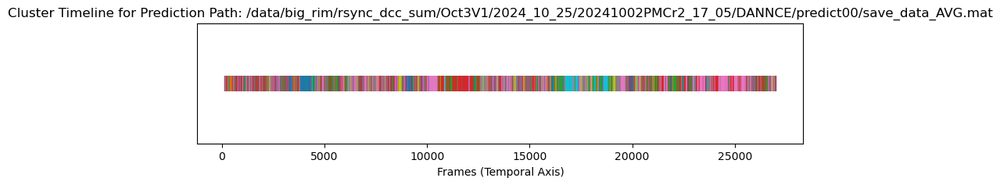

In [101]:
# Now plot the cluster timeline
plot_cluster_timeline_from_df(filtered_df)


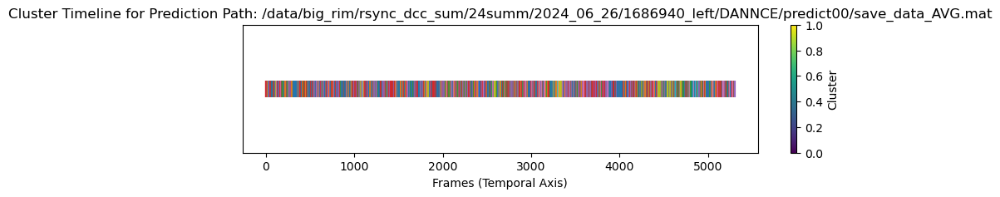

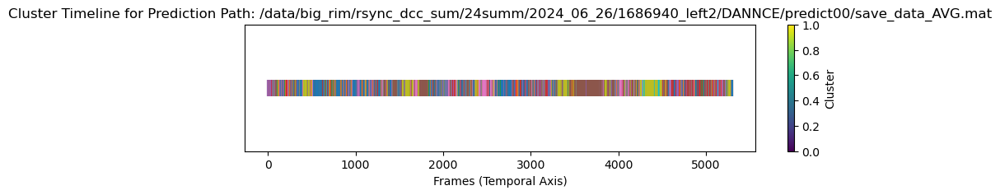

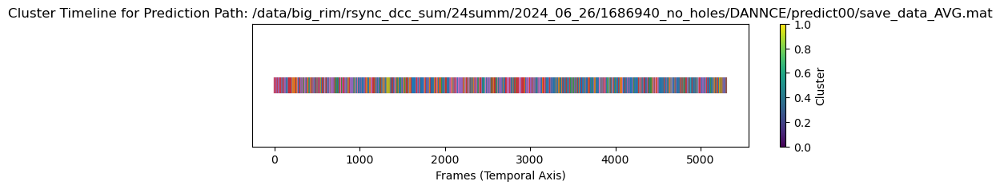

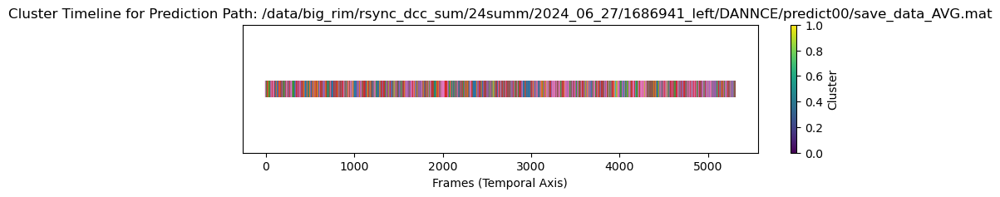

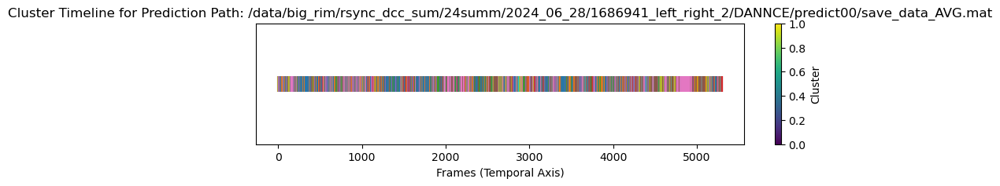

...

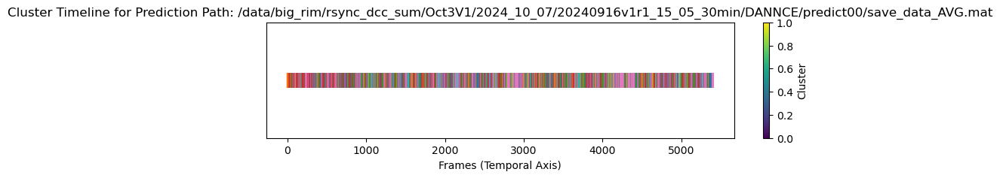

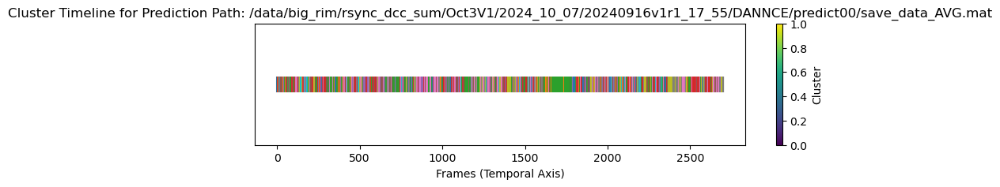

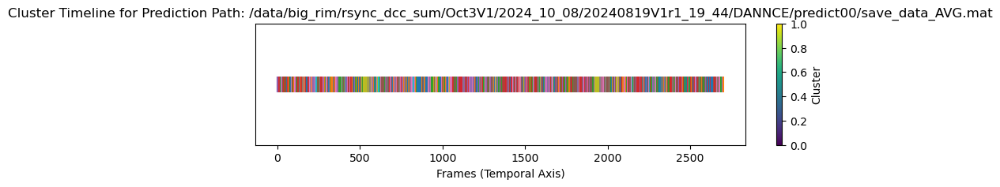

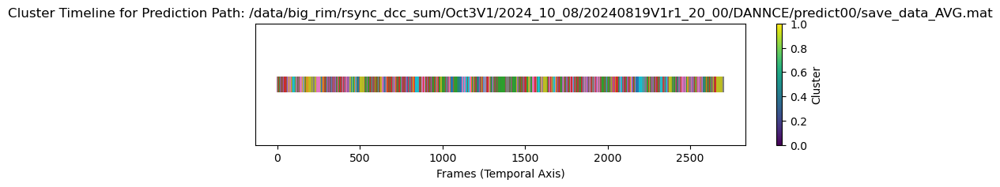

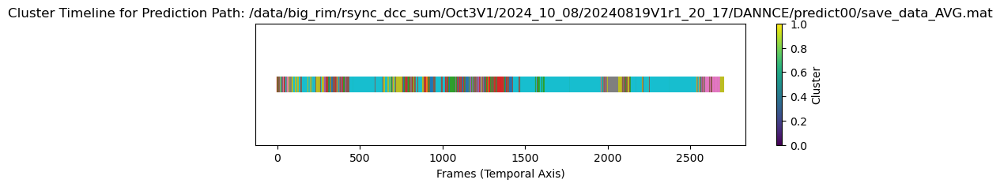

KeyboardInterrupt: 

In [26]:
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_timeline(data_obj):
    # Get unique prediction paths
    unique_paths = data_obj.data['Prediction_path'].unique()
    
    for path in unique_paths:
        # Filter data for this path
        path_data = data_obj.data[data_obj.data['Prediction_path'] == path]
        
        # Extract temporal and cluster information
        n_frames = path_data['n_frames'].values if 'n_frames' in path_data else np.arange(len(path_data))
        clusters = path_data['Cluster'].values
        
        # Create a colormap for clusters
        unique_clusters = np.unique(clusters)
        norm = plt.Normalize(vmin=min(unique_clusters), vmax=max(unique_clusters))
        cluster_colors = plt.cm.tab10(norm(clusters))
        
        # Plot
        plt.figure(figsize=(10, 2))
        scatter = plt.scatter(n_frames, np.zeros_like(n_frames), c=cluster_colors, marker='|', s=200)
        plt.title(f"Cluster Timeline for Prediction Path: {path}")
        plt.xlabel("Frames (Temporal Axis)")
        plt.yticks([])  # Hide Y-axis since it's not meaningful here
        
        # Add a colorbar
        cbar = plt.colorbar(scatter, orientation="vertical")
        cbar.set_label("Cluster")
        
        # Save and show
        plt.savefig(f"{path}_cluster_timeline.png")  # Save plot if needed
        plt.show()

# Call the function with the loaded data object
plot_cluster_timeline(loaded_data_obj)
